### 1. Read Images

In [1]:
!pip install opencv-python

In [2]:
# install libraries

import re
import os
import cv2
import math
import zipfile
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from glob import glob
from os.path import join, exists, basename, normpath, split
from matplotlib import pyplot as plt
from PIL import Image
from shutil import copyfile
from scipy.stats import norm
import imageio

In [3]:
import glob
# function to read images
def Read_Image(imageDirectory):
    imageFormat = ['png']    # Add image formats here
    files = []
    [files.extend(glob.glob(imageDirectory + '*.' + e)) for e in imageFormat]
    imagesList = np.empty(len(files), dtype=object)
    for n in range(0, len(files)):
        imagesList[n] = cv2.imread(files[n],-1)
    return imagesList

#### 1.1  Read intensity and tm images

In [4]:
# read tm images
controlTmImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH tm/Control/'
glyTmImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH tm/Glycolysis/'
cyanideTmImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH tm/Cyanide/'

controlTmImageList = Read_Image(controlTmImageDirectory)
glyTmImageList = Read_Image(glyTmImageDirectory)
cyanideTmImageList = Read_Image(cyanideTmImageDirectory)

# read intensity images
controlIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH Intensity/Control/'
glyIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH Intensity/Glycolysis/'
cyanideIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH Intensity/Cyanide/'

controlIntImageList = Read_Image(controlIntensityImageDirectory)
glyIntImageList = Read_Image(glyIntensityImageDirectory)
cyanideIntImageList = Read_Image(cyanideIntensityImageDirectory)


# Get the image number
controlImageNumber = len(controlTmImageList)
glyImageNumber = len(glyTmImageList)
cyanideNumber = len(cyanideTmImageList)

In [5]:
print(len(controlTmImageList))
print(len(glyTmImageList))
print(len(cyanideTmImageList))

print(len(controlIntImageList))
print(len(glyIntImageList))
print(len(cyanideIntImageList))

2170
2996
2095
2170
2996
2095


#### 1.2  Read t1, t2, a1 images

In [6]:
# read t1 images
controlT1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t1/Control/'
glyT1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t1/Glycolysis/'
cyanideT1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t1/Cyanide/'

controlT1ImageList = Read_Image(controlT1ImageDirectory)
glyT1ImageList = Read_Image(glyT1ImageDirectory)
cyanideT1ImageList = Read_Image(cyanideT1ImageDirectory)

# read t2 images
controlT2ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t2/Control/'
glyT2ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t2/Glycolysis/'
cyanideT2ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH t2/Cyanide/'

controlT2ImageList = Read_Image(controlT2ImageDirectory)
glyT2ImageList = Read_Image(glyT2ImageDirectory)
cyanideT2ImageList = Read_Image(cyanideT2ImageDirectory)

# read t2 images
controlA1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH a1/Control/'
glyA1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH a1/Glycolysis/'
cyanideA1ImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/NADH a1/Cyanide/'

controlA1ImageList = Read_Image(controlA1ImageDirectory)
glyA1ImageList = Read_Image(glyA1ImageDirectory)
cyanideA1ImageList = Read_Image(cyanideA1ImageDirectory)


In [7]:
print(len(controlT1ImageList))
print(len(glyT1ImageList))
print(len(cyanideT1ImageList))

print(len(controlT2ImageList))
print(len(glyT2ImageList))
print(len(cyanideT2ImageList))

print(len(controlA1ImageList))
print(len(glyA1ImageList))
print(len(cyanideA1ImageList))

2170
2996
2095
2170
2996
2095
2170
2996
2095


#### 1.3  Read FAD intensity images

In [8]:
# read FAD intensity images
controlFADIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/FAD Intensity/Control/'
glyFADIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/FAD Intensity/Glycolysis/'
cyanideFADIntensityImageDirectory = 'C:/Linghao Hu/Project/Metabolic_Study/CNN_Classify/Dataset/Whole Cell/FAD Intensity/Cyanide/'

controlFADIntImageList = Read_Image(controlFADIntensityImageDirectory)
glyFADIntImageList = Read_Image(glyFADIntensityImageDirectory)
cyanideFADIntImageList = Read_Image(cyanideFADIntensityImageDirectory)

print(len(controlFADIntImageList))
print(len(glyFADIntImageList))
print(len(cyanideFADIntImageList))

2170
2996
2095


#### 1.3 Combine the tm and intensity

In [9]:
def Combine_NADH_FLIM(intImageList, tmImageList, t1ImageList, t2ImageList, a1ImageList, fadIntImageList):
    imageNumber = len(intImageList)
    imageList = np.empty(imageNumber, dtype=object)
    for i in range(imageNumber):
        imageList[i] = [intImageList[i], tmImageList[i], t1ImageList[i], t2ImageList[i], a1ImageList[i], fadIntImageList[i]]
    return imageList  

In [10]:
controlImageList = Combine_NADH_FLIM(controlIntImageList,controlTmImageList,controlT1ImageList,controlT2ImageList,controlA1ImageList,controlFADIntImageList)
glyImageList = Combine_NADH_FLIM(glyIntImageList,glyTmImageList,glyT1ImageList,glyT2ImageList,glyA1ImageList,glyFADIntImageList)
cyanideImageList = Combine_NADH_FLIM(cyanideIntImageList,cyanideTmImageList,cyanideT1ImageList,cyanideT2ImageList,cyanideA1ImageList,cyanideFADIntImageList)

#### 1.4 Show a typical image for each group

In [11]:
def colorbar(mappable):
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    import matplotlib.pyplot as plt
    last_axes = plt.gca()
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(mappable, cax=cax)
    plt.sca(last_axes)
    return cbar

#### Control

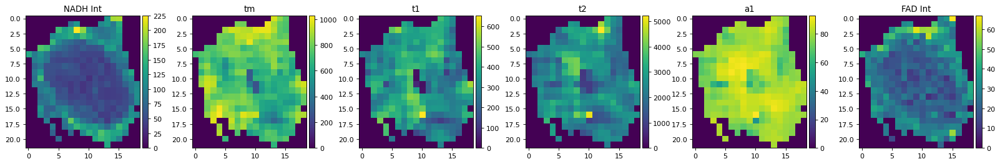

In [12]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6 ) = plt.subplots(ncols=6,figsize=(20, 20), dpi=80)
img1 = ax1.imshow(controlImageList[1000][0])
colorbar(img1)
img2 = ax2.imshow(controlImageList[1000][1])
colorbar(img2)
img3 = ax3.imshow(controlImageList[1000][2])
colorbar(img3)
img4 = ax4.imshow(controlImageList[1000][3])
colorbar(img4)
img5 = ax5.imshow(controlImageList[1000][4])
colorbar(img5)
img6 = ax6.imshow(controlImageList[1000][5])
colorbar(img6)
ax1.title.set_text('NADH Int')
ax2.title.set_text('tm')
ax3.title.set_text('t1')
ax4.title.set_text('t2')
ax5.title.set_text('a1')
ax6.title.set_text('FAD Int')
plt.tight_layout(h_pad=1)

#### Glycolysis inhibition

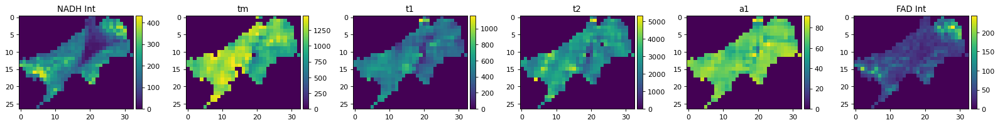

In [13]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6 ) = plt.subplots(ncols=6,figsize=(20, 20), dpi=80)
img1 = ax1.imshow(glyImageList[2000][0])
colorbar(img1)
img2 = ax2.imshow(glyImageList[2000][1])
colorbar(img2)
img3 = ax3.imshow(glyImageList[2000][2])
colorbar(img3)
img4 = ax4.imshow(glyImageList[2000][3])
colorbar(img4)
img5 = ax5.imshow(glyImageList[2000][4])
colorbar(img5)
img6 = ax6.imshow(glyImageList[2000][5])
colorbar(img6)
ax1.title.set_text('NADH Int')
ax2.title.set_text('tm')
ax3.title.set_text('t1')
ax4.title.set_text('t2')
ax5.title.set_text('a1')
ax6.title.set_text('FAD Int')
plt.tight_layout(h_pad=1)

#### OXPHOS inhibition

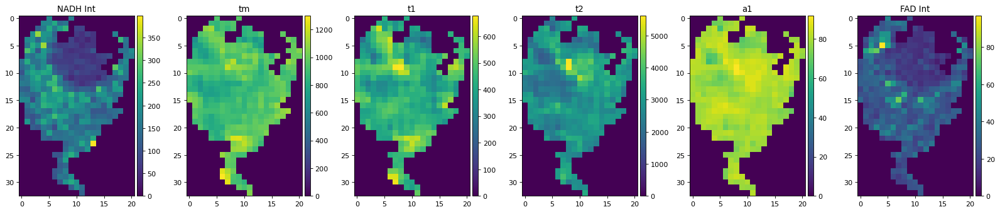

In [14]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6 ) = plt.subplots(ncols=6,figsize=(20, 20), dpi=80)
img1 = ax1.imshow(cyanideImageList[1000][0])
colorbar(img1)
img2 = ax2.imshow(cyanideImageList[1000][1])
colorbar(img2)
img3 = ax3.imshow(cyanideImageList[1000][2])
colorbar(img3)
img4 = ax4.imshow(cyanideImageList[1000][3])
colorbar(img4)
img5 = ax5.imshow(cyanideImageList[1000][4])
colorbar(img5)
img6 = ax6.imshow(cyanideImageList[1000][5])
colorbar(img6)
ax1.title.set_text('NADH Int')
ax2.title.set_text('tm')
ax3.title.set_text('t1')
ax4.title.set_text('t2')
ax5.title.set_text('a1')
ax6.title.set_text('FAD Int')
plt.tight_layout(h_pad=1)

### 2. tm and Intensity Analysis

#### 2.1 tm analysis 

#### Summarize the tm frequency and histogram 

In [15]:
mintm = 100
maxtm = 1501
distance = 10
distanceArray = np.array(list(range(mintm,maxtm,distance)))
distanceNumber = distanceArray.size - 1

def Summarize_tm_Histogram(imageList):
# input: image list
# output pixel value histogram summary(excluding zero values)
    summaryHist = np.zeros(distanceNumber)
    for image in imageList:
        hist,bins = np.histogram(image,bins = distanceArray)
        summaryHist = summaryHist + hist
    return summaryHist / sum(summaryHist)

In [16]:
minValue = mintm + distance
tmDistance = np.array(list(range(minValue,maxtm,distance)))
tmHistogramControl = Summarize_tm_Histogram(controlTmImageList)
tmHistogramGlycolysis = Summarize_tm_Histogram(glyTmImageList)
tmHistogramCyanide = Summarize_tm_Histogram(cyanideTmImageList)

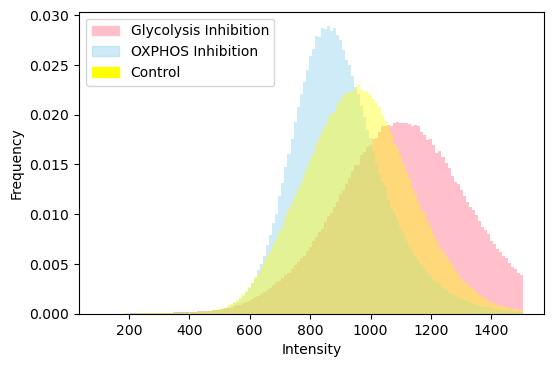

In [17]:
plt.figure(dpi=100)
plt.bar(tmDistance,tmHistogramGlycolysis, width = distance, align='center', color="pink")
plt.bar(tmDistance, tmHistogramCyanide, width=distance, align='center', color=(135/255,
                                                              206/255,
                                                              235/255,
                                                              0.4))
plt.bar(tmDistance, tmHistogramControl, width=distance, align='center', color= 'yellow', alpha = 0.4)
pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color=(135/255, 206/255, 235/255, 0.4),
                            label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label = 'Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch ])
plt.ylabel('Frequency')
plt.xlabel('Intensity')
plt.show(3)

#### 2.2 Intensity analysis

#### Summarize the NADH Intensity frequency and histogram 

In [18]:
minint = 5
maxint = 1501
distance = 10
distanceArray = np.array(list(range(minint,maxint,distance)))
distanceNumber = distanceArray.size - 1

def Summarize_Int_Histogram(imageList):
# input: image list
# output pixel value histogram summary(excluding zero values)
    summaryHist = np.zeros(distanceNumber)
    for image in imageList:
        hist,bins = np.histogram(image,bins = distanceArray)
        summaryHist = summaryHist + hist
    return summaryHist / sum(summaryHist)

minValue = minint + distance
intDistance = np.array(list(range(minValue,maxint,distance)))
intHistogramControl = Summarize_tm_Histogram(controlIntImageList)
intHistogramGlycolysis = Summarize_tm_Histogram(glyIntImageList)
intHistogramCyanide = Summarize_tm_Histogram(cyanideIntImageList)

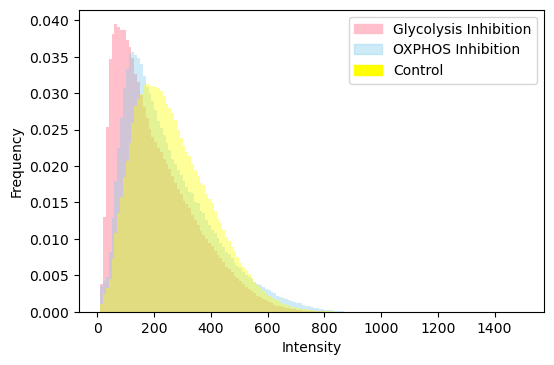

In [19]:
plt.figure(dpi=100)
plt.bar(intDistance,intHistogramGlycolysis, width = distance, align='center', color="pink")
plt.bar(intDistance, intHistogramCyanide, width=distance, align='center', color=(135/255,
                                                              206/255,
                                                              235/255,
                                                              0.4))
plt.bar(intDistance, intHistogramControl, width=distance, align='center', color= 'yellow', alpha = 0.4)

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color=(135/255, 206/255, 235/255, 0.4),
                            label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label = 'Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch ])
plt.ylabel('Frequency')
plt.xlabel('Intensity')
plt.show(3)

### 3. Entropy Summary

In [20]:
minValue = 1
maxValue = 1501
distance = 1
distanceArray = np.array(list(range(minValue,maxValue,distance)))
distanceNumber = distanceArray.size - 1

def Compute_Entropy(image):
    """
    Compute the entropy function (like entropy() in Matlab)
    
    Args:
        image_name(string): path to the image
    
    Returns:
        int: entropy to the image
    """
    
    hist,bins = np.histogram(image,bins = distanceArray,density=False)

    # Remove zeroes
    hist_no_zero = np.array([i for i in hist if i != 0])
    # Normalize the hist so it sums to 1
    hist_no_zero = hist_no_zero / np.size(image)

    # Compute the entropy
    log_2 = np.log(hist_no_zero) / np.log(2)
    entropy = -1 * np.dot(hist_no_zero, log_2)
    return entropy

#### 3.1 NADH tm entropy calculation

In [21]:
controlTmEntropyList = [Compute_Entropy(n) for n in controlTmImageList]
glycolysisTmEntropyList = [Compute_Entropy(n) for n in glyTmImageList]
cyanideTmEntropyList = [Compute_Entropy(n) for n in cyanideTmImageList]

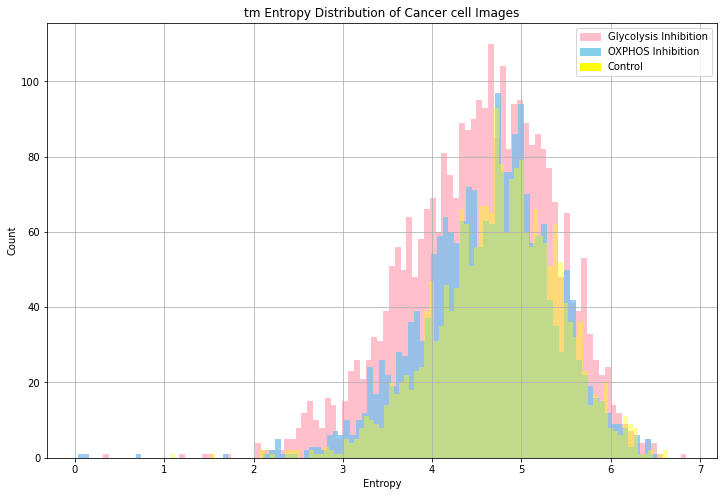

In [22]:
f, ax1 = plt.subplots(1, sharey=True, figsize=(12, 8))

n, bins, patches = ax1.hist(glycolysisTmEntropyList, 100, facecolor='pink')
n, bins, patches = ax1.hist(cyanideTmEntropyList, 100, facecolor=(126/255,
                                                             192/255,
                                                             238/255,0.8))

n, bins, patches = ax1.hist(controlTmEntropyList, 100, facecolor = 'yellow', alpha = 0.4)  # Control

ax1.set_xlabel('Entropy')
ax1.set_ylabel('Count')
ax1.set_title("tm Entropy Distribution of Cancer cell Images")
ax1.grid(True)

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color='skyblue', label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label='Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch])

plt.show()

#### Define the tm threshold

In [23]:
# Define the threshold.
# first one for glycolysis inhibition group

glycolysisTmEntropyMean = np.mean(glycolysisTmEntropyList)
glycolysisTmEntropyStd = np.std(glycolysisTmEntropyList)

cutoffGlycolysisTmEntropy = glycolysisTmEntropyMean - 3 * glycolysisTmEntropyStd

# second one for both OXPHOS group
cyanideTmEntropyMean = np.mean(cyanideTmEntropyList)
cyanideTmEntropyStd =  np.std(cyanideTmEntropyList)
cutoffCyanideTmEntropy = cyanideTmEntropyMean - 3 * cyanideTmEntropyStd

# third one for control group
controlTmEntropyMean = np.mean(controlTmEntropyList)
controlTmEntropyStd =  np.std(controlTmEntropyList)
cutoffControlTmEntropy = controlTmEntropyMean - 3 * controlTmEntropyStd

print("The cut-off of glycolysis inhibited cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffGlycolysisTmEntropy))
print("The cut-off of OXPHOS inhibited cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffCyanideTmEntropy))
print("The cut-off of control cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffControlTmEntropy))


The cut-off of glycolysis inhibited cells for lower 1% is at point 2.0847017097387717.
The cut-off of OXPHOS inhibited cells for lower 1% is at point 2.3787448426689988.
The cut-off of control cells for lower 1% is at point 2.670462615773739.


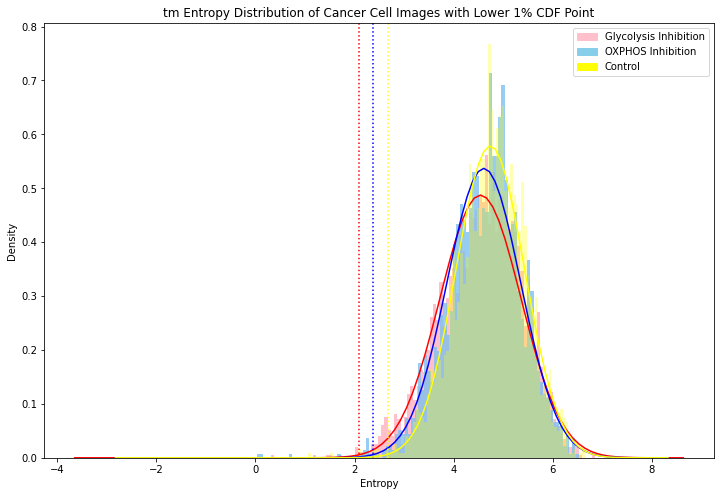

In [24]:
# Replot the figures with the thresohld lines
f, ax1 = plt.subplots(1, sharey=True, figsize=(12, 8))

n, bins, patches = ax1.hist(glycolysisTmEntropyList, 100, facecolor='pink', density=True)
n, bins, patches = ax1.hist(cyanideTmEntropyList, 100, facecolor=(126/255,
                                                             192/255,
                                                             238/255,
                                                             0.8), density=True)
n, bins, patches = ax1.hist(controlTmEntropyList, 100, facecolor = 'yellow', alpha = 0.3, density=True)

# Add normal plot
# The dist is slightly left skewed, so we plot more area on the left tail
x_g = np.linspace(glycolysisTmEntropyMean - 10*glycolysisTmEntropyStd, glycolysisTmEntropyMean + 5*glycolysisTmEntropyStd, 100)
ax1.plot(x_g, norm.pdf(x_g, glycolysisTmEntropyMean,glycolysisTmEntropyStd) , color="red")
ax1.axvline(x=cutoffGlycolysisTmEntropy, color="red", linestyle=':')

x_o = np.linspace(cyanideTmEntropyMean - 10*cyanideTmEntropyStd, cyanideTmEntropyMean + 5*cyanideTmEntropyStd, 100)
ax1.plot(x_o, norm.pdf(x_o, cyanideTmEntropyMean,cyanideTmEntropyStd) , color="blue")
ax1.axvline(x=cutoffCyanideTmEntropy, color="blue", linestyle=':')

x_c = np.linspace(controlTmEntropyMean - 10*controlTmEntropyStd, controlTmEntropyMean + 5*controlTmEntropyStd, 100)
ax1.plot(x_o, norm.pdf(x_o, controlTmEntropyMean,controlTmEntropyStd) , color="yellow")
ax1.axvline(x=cutoffControlTmEntropy, color="yellow", linestyle=':')


ax1.set_xlabel('Entropy')
ax1.set_ylabel('Density')
ax1.set_title("tm Entropy Distribution of Cancer Cell Images with Lower " +
              "{:.0f}% CDF Point".format(0.01*100))
ax1.grid(False)

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color='skyblue', label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label='Control')

plt.legend(handles=[pink_patch, blue_patch,yellow_patch])

plt.show()

#### 3.2 NADH Intensity entropy calculation

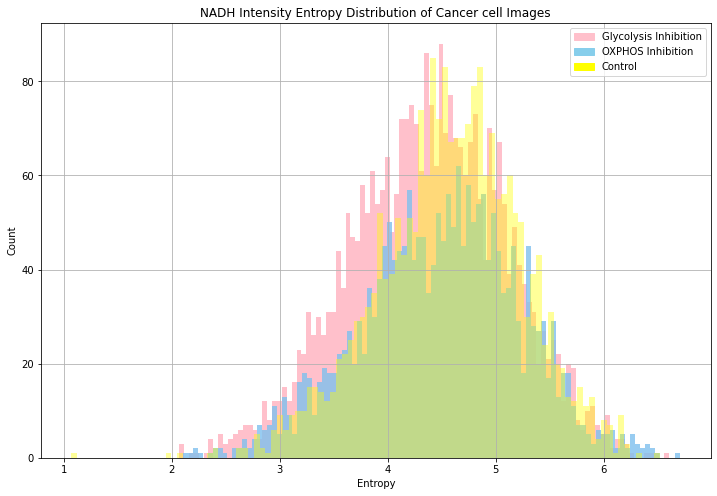

In [25]:
controlIntEntropyList = [Compute_Entropy(n) for n in controlIntImageList]
glycolysisIntEntropyList = [Compute_Entropy(n) for n in glyIntImageList]
cyanideIntEntropyList = [Compute_Entropy(n) for n in cyanideIntImageList]

f, ax1 = plt.subplots(1, sharey=True, figsize=(12, 8))

n, bins, patches = ax1.hist(glycolysisIntEntropyList, 100, facecolor='pink')
n, bins, patches = ax1.hist(cyanideIntEntropyList, 100, facecolor=(126/255,
                                                             192/255,
                                                             238/255,0.8))

n, bins, patches = ax1.hist(controlIntEntropyList, 100, facecolor = 'yellow', alpha = 0.4)  # Control

ax1.set_xlabel('Entropy')
ax1.set_ylabel('Count')
ax1.set_title("NADH Intensity Entropy Distribution of Cancer cell Images")
ax1.grid(True)

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color='skyblue', label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label='Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch])

plt.show()

#### Define the Intensity threshold

In [26]:
# Define the threshold.
# first one for glycolysis inhibition group

glycolysisIntEntropyMean = np.mean(glycolysisIntEntropyList)
glycolysisIntEntropyStd = np.std(glycolysisIntEntropyList)

cutoffGlycolysisIntEntropy = glycolysisIntEntropyMean - 3 * glycolysisIntEntropyStd

# second one for both OXPHOS group
cyanideIntEntropyMean = np.mean(cyanideIntEntropyList)
cyanideIntEntropyStd =  np.std(cyanideTmEntropyList)
cutoffCyanideIntEntropy = cyanideIntEntropyMean - 3 * cyanideIntEntropyStd

# third one for control group
controlIntEntropyMean = np.mean(controlIntEntropyList)
controlIntEntropyStd =  np.std(controlIntEntropyList)
cutoffControlIntEntropy = controlIntEntropyMean - 3 * controlIntEntropyStd

print("The cut-off of glycolysis inhibited cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffGlycolysisIntEntropy))
print("The cut-off of OXPHOS inhibited cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffCyanideIntEntropy))
print("The cut-off of control cells for lower " +
      "{:.0f}% is at point {}.".format(0.01 * 100, cutoffControlIntEntropy))


The cut-off of glycolysis inhibited cells for lower 1% is at point 2.1958866897621787.
The cut-off of OXPHOS inhibited cells for lower 1% is at point 2.258005870951962.
The cut-off of control cells for lower 1% is at point 2.581021969123172.


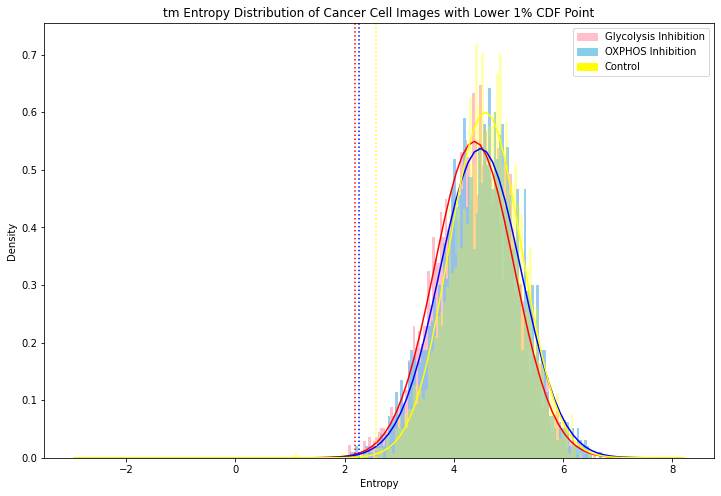

In [27]:
# Replot the figures with the thresohld lines
f, ax1 = plt.subplots(1, sharey=True, figsize=(12, 8))

n, bins, patches = ax1.hist(glycolysisIntEntropyList, 100, facecolor='pink', density=True)
n, bins, patches = ax1.hist(cyanideIntEntropyList, 100, facecolor=(126/255,
                                                             192/255,
                                                             238/255,
                                                             0.8), density=True)
n, bins, patches = ax1.hist(controlIntEntropyList, 100, facecolor = 'yellow', alpha = 0.3, density=True)

# Add normal plot
# The dist is slightly left skewed, so we plot more area on the left tail
x_g = np.linspace(glycolysisIntEntropyMean - 10*glycolysisIntEntropyStd, glycolysisIntEntropyMean + 5*glycolysisIntEntropyStd, 100)
ax1.plot(x_g, norm.pdf(x_g, glycolysisIntEntropyMean,glycolysisIntEntropyStd) , color="red")
ax1.axvline(x=cutoffGlycolysisIntEntropy, color="red", linestyle=':')

x_o = np.linspace(cyanideIntEntropyMean - 10*cyanideIntEntropyStd, cyanideIntEntropyMean + 5*cyanideIntEntropyStd, 100)
ax1.plot(x_o, norm.pdf(x_o, cyanideIntEntropyMean,cyanideIntEntropyStd) , color="blue")
ax1.axvline(x=cutoffCyanideIntEntropy, color="blue", linestyle=':')

x_c = np.linspace(controlIntEntropyMean - 10*controlIntEntropyStd, controlIntEntropyMean + 5*controlIntEntropyStd, 100)
ax1.plot(x_o, norm.pdf(x_o, controlIntEntropyMean,controlIntEntropyStd) , color="yellow")
ax1.axvline(x=cutoffControlIntEntropy, color="yellow", linestyle=':')


ax1.set_xlabel('Entropy')
ax1.set_ylabel('Density')
ax1.set_title("tm Entropy Distribution of Cancer Cell Images with Lower " +
              "{:.0f}% CDF Point".format(0.01*100))
ax1.grid(False)

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color='skyblue', label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label='Control')

plt.legend(handles=[pink_patch, blue_patch,yellow_patch])

plt.show()

#### 3.3 Filter Images

In [28]:
# We will use the threshold to filter the images in each group
def Filter_Entropy(imageList, tmThreshold, intThreshold):
    newImageList = []
    discardImageList = []
    for image in imageList:
        tmEntropy = Compute_Entropy(image[1])
        intEntropy = Compute_Entropy(image[0])
        if tmEntropy > tmThreshold and intEntropy > intThreshold :
            newImageList.append(image)
        else:
            discardImageList.append(image)
    return(newImageList, discardImageList)

#### Control filtered cells

In [29]:
# filter control group
(newControlImageList,discardControlImageList) = Filter_Entropy(controlImageList, cutoffControlTmEntropy, cutoffControlIntEntropy)
n = len(discardControlImageList)

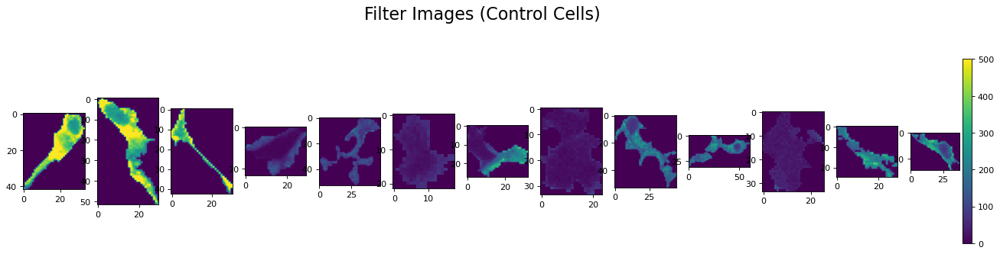

In [30]:
if n > 0:
    fig, ax = plt.subplots(1,n,figsize=(20, 5), dpi=80)
    fig.suptitle('Filter Images (Control Cells)',fontsize = 20)
    for i in range(n):
        ax[i].imshow(discardControlImageList[i][0], vmin=0, vmax=500)
        if i == n-1:
            a = ax[i].imshow(discardControlImageList[i][0], vmin=0, vmax=500)
            fig.colorbar(a,ax=ax[i])
else:
    print('No images are below the threshold')

#### Glycolysis inhibition filtered cells

In [31]:
# filter glycolysis inhibition group
(newGlyImageList,discardGlyImageList) = Filter_Entropy(glyImageList,cutoffGlycolysisTmEntropy, cutoffGlycolysisIntEntropy)
n = len(discardGlyImageList)

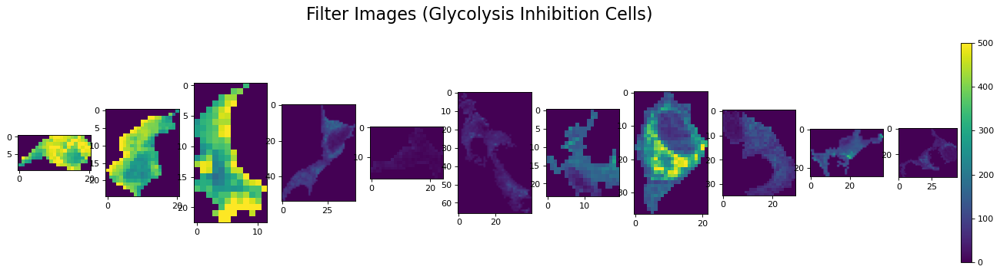

In [32]:
if n > 0:
    fig, ax = plt.subplots(1,n,figsize=(20, 5), dpi=80)
    fig.suptitle('Filter Images (Glycolysis Inhibition Cells)',fontsize = 20)
    for i in range(n):
        ax[i].imshow(discardGlyImageList[i][0], vmin=0, vmax=500)
        if i == n-1:
            a = ax[i].imshow(discardGlyImageList[i][0], vmin=0, vmax=500)
            fig.colorbar(a,ax=ax[i])
else:
    print('No images are below the threshold')

#### OXPHOS inhibition filtered cells

In [33]:
# filter OXPHOS inhibition group
(newCyanideImageList,discardCyanideImageList) = Filter_Entropy(cyanideImageList,cutoffCyanideTmEntropy,cutoffCyanideIntEntropy)
n = len(discardCyanideImageList)

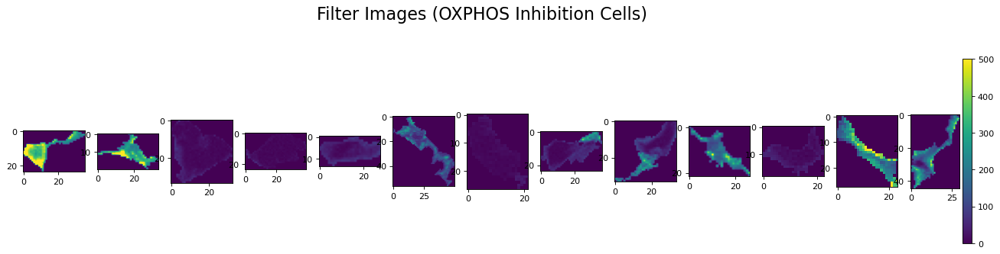

In [34]:
if n > 0:
    fig, ax = plt.subplots(1,n,figsize=(20, 5), dpi=80)
    fig.suptitle('Filter Images (OXPHOS Inhibition Cells)',fontsize = 20)
    for i in range(n):
        ax[i].imshow(discardCyanideImageList[i][0], vmin=0, vmax=500)
        if i == n-1:
            a = ax[i].imshow(discardCyanideImageList[i][0], vmin=0, vmax=500)
            fig.colorbar(a,ax=ax[i])
else:
    print('No images are below the threshold')

### 4. Image Padding

#### 4.1 Summarize the image size frequency 

In [35]:
def Summarize_Size_Histogram (imageList):
    sizeList = []
    for image in imageList:
        width = np.size(image[0],1)
        height = np.size(image[0],0)
        cellSize =  np.count_nonzero(image[0])
        sizeList.append((max(width,height),image,cellSize,width,height))
    sortedSizeList = sorted(sizeList, key = lambda x:x[0], reverse = True)
    return sortedSizeList

In [36]:
sizeListControl = Summarize_Size_Histogram(newControlImageList)
sizeListGlycolysis = Summarize_Size_Histogram(newGlyImageList)
sizeListCyanide = Summarize_Size_Histogram(newCyanideImageList)

cellSizeControl = [item[2] for item in sizeListControl]
cellSizeGlycolysis = [item[2] for item in sizeListGlycolysis]
cellSizeCyanide = [item[2] for item in sizeListCyanide]


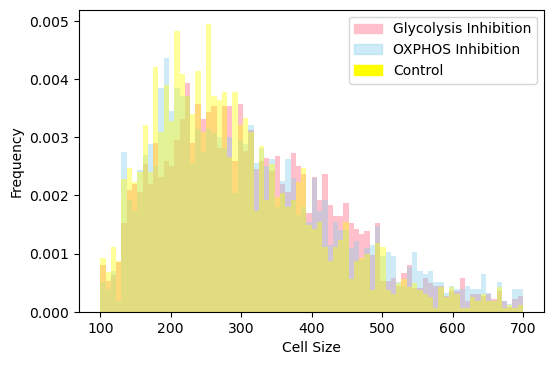

In [37]:
plt.figure(dpi=100)
plt.hist(cellSizeGlycolysis, density= True, bins= 80, color="pink")  # Inhibit glycolysis
plt.hist(cellSizeCyanide, density=True, bins= 80, color=(135/255,
                                                         206/255,
                                                         235/255,
                                                         0.4))  # Inhibit OXPHOS
plt.hist(cellSizeControl, density=True, bins=80, color= 'yellow', alpha = 0.4)  # Control

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color=(135/255, 206/255, 235/255, 0.4),
                            label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label = 'Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch ])

plt.ylabel('Frequency')
plt.xlabel('Cell Size');
plt.show(3)

#### 4.2 Get the biggest image size

In [38]:
# find the max dimension
maxLength =  max(sizeListControl[0][0],sizeListGlycolysis[0][0],sizeListCyanide[0][0])
# Display the images with largest dimension in each group
largestPerGroup = [sizeListControl[0],sizeListGlycolysis[0],sizeListCyanide[0]]

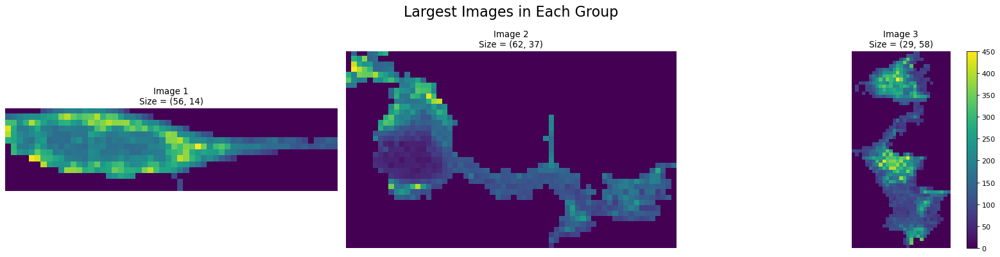

In [39]:
plt.figure(figsize=(20, 5), dpi=80)
for i in range(3):   
    plt.subplot(1, 3, i+1)
    plt.imshow(largestPerGroup[i][1][0])
    plt.axis("off")
    plt.title("Image {}\nSize = ({}, {})".format(i+1,largestPerGroup[i][3],largestPerGroup[i][4]))

plt.suptitle("Largest Images in Each Group", fontsize = 20)
plt.tight_layout()
plt.colorbar()
plt.show()

Conclusion: The biggest images are clustered cells or cells with tails, so I would set the biggest image size to be 40 X 40.

#### 4.3 Get the most common image size

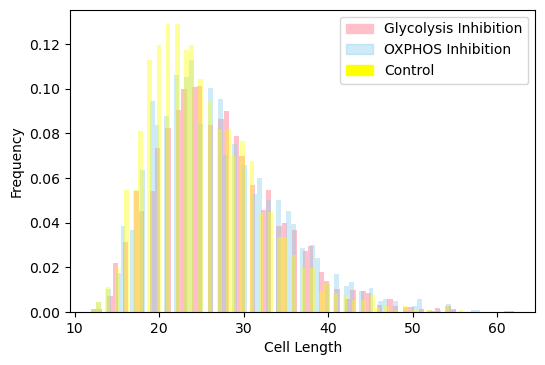

In [40]:
cellLengthControl = [item[0] for item in sizeListControl]
cellLengthGlycolysis = [item[0] for item in sizeListGlycolysis]
cellLengthCyanide = [item[0] for item in sizeListCyanide]

plt.figure(dpi=100)
plt.hist(cellLengthGlycolysis, density= True, bins= 80, color="pink")  # Inhibit glycolysis
plt.hist(cellLengthCyanide, density=True, bins= 80, color=(135/255,
                                                         206/255,
                                                         235/255,
                                                         0.4))  # Inhibit OXPHOS
plt.hist(cellLengthControl, density=True, bins=80, color= 'yellow', alpha = 0.4)  # Control

pink_patch = mpatches.Patch(color='pink', label='Glycolysis Inhibition')
blue_patch = mpatches.Patch(color=(135/255, 206/255, 235/255, 0.4),
                            label='OXPHOS Inhibition')
yellow_patch = mpatches.Patch(color='yellow', label = 'Control')
plt.legend(handles=[pink_patch, blue_patch, yellow_patch ])

plt.ylabel('Frequency')
plt.xlabel('Cell Length');
plt.show(3)

Conclusion: The most commmon length is around 20 ~ 25

#### 4.3 Add padding and save them in the document disk

In [41]:
maxLength = 40

In [42]:
# add padding to orignial images
def Add_Padding(image, maxLength):
    """
    This function add black paadings to the image to unify their sizes.
    Input: image, max length, padding color
    Output: The padding image
    """
    width = np.size(image,1)
    height = np.size(image,0)
    newImage = np.zeros((maxLength,maxLength))
    # put the original image in the center
    if max(width,height) <= maxLength:
        xShift = (maxLength - width)//2
        yShift = (maxLength - height)//2
        newImage[yShift : yShift + height, xShift : xShift + width] = image
    elif width > maxLength and height > maxLength:
        xShift = (width - maxLength)//2
        yShift = (height - maxLength)//2
        newImage = image[yShift:yShift+maxLength,xShift: xShift+maxLength]
    elif width > maxLength:
        xShift = (width - maxLength)//2
        yShift = (maxLength - height)//2
        newImage[yShift : yShift + height,:] = image[:,xShift:xShift + maxLength]
    else: 
        xShift = (maxLength - width)//2
        yShift = (height - maxLength)//2
        newImage[:,xShift : xShift + width] = image[yShift: yShift+maxLength,:]
    
    return (newImage)

def Save_Padding_Image(imageList,saveIntPosition,saveTmPosition,saveT1Position,saveT2Position,saveA1Position,saveFADIntPosition):
    newImagesList = np.empty(len(imageList), dtype=object)
    for n in range(0, len(imageList)):
        newIntImage = Add_Padding(imageList[n][0], maxLength)
        newTmImage = Add_Padding(imageList[n][1], maxLength)
        newT1Image = Add_Padding(imageList[n][2], maxLength)
        newT2Image = Add_Padding(imageList[n][3], maxLength)
        newA1Image = Add_Padding(imageList[n][4], maxLength)
        newFADIntImage = Add_Padding(imageList[n][5], maxLength)
        
        savingIntPathway = saveIntPosition + str(n) + '.png'
        savingTmPathway = saveTmPosition + str(n) + '.png'
        savingT1Pathway = saveT1Position + str(n) + '.png'
        savingT2Pathway = saveT2Position + str(n) + '.png'
        savingA1Pathway = saveA1Position + str(n) + '.png'
        savingFADIntPathway = saveFADIntPosition + str(n) + '.png'
        
        imageio.imwrite(savingIntPathway, newIntImage.astype(np.uint16))
        imageio.imwrite(savingTmPathway, newTmImage.astype(np.uint16))
        imageio.imwrite(savingT1Pathway, newT1Image.astype(np.uint16))
        imageio.imwrite(savingT2Pathway, newT2Image.astype(np.uint16))
        imageio.imwrite(savingA1Pathway, newA1Image.astype(np.uint8))
        imageio.imwrite(savingFADIntPathway, newFADIntImage.astype(np.uint16))
        
        newImagesList[n] = [newIntImage,newTmImage,newT1Image,newT2Image,newA1Image,newFADIntImage]
    return(newImagesList)

In [43]:
# Since we have excluded some cells(touch borders, cluster together, extremely small cells) in the cellprolifer, most cells work for future procedure.
# We will add padding to all images and save them in the documents.

# Control
padControlList = Save_Padding_Image(newControlImageList,
                                    'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/NADH Intensity/Control/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/tm/Control/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t1/Control/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t2/Control/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/a1/Control/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/FAD Intensity/Control/')
# Glycolysis
padGlycolysisList = Save_Padding_Image(newGlyImageList,
                                    'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/NADH Intensity/Glycolysis/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/tm/Glycolysis/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t1/Glycolysis/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t2/Glycolysis/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/a1/Glycolysis/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/FAD Intensity/Glycolysis/')
# OXPHOS
padOXPHOSList = Save_Padding_Image(newCyanideImageList,
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/NADH Intensity/OXPHOS/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/tm/OXPHOS/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t1/OXPHOS/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/t2/OXPHOS/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/a1/OXPHOS/',
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/40 x 40/FAD Intensity/OXPHOS/')


#### 4.3 Crop to be 23 X 23 and save them in the document disk

In [44]:
def Crop_Padding_Image(image, cropSize):
    cropLength = math.floor(cropSize/2)
    [length, width] = image.shape
    length = math.floor(length/2)
    width = math.floor(width/2)
    cropImage = image[length- cropLength:length + cropSize - cropLength,
                     width - cropLength: width + cropSize - cropLength]
    return cropImage

In [45]:
def Save_Crop_Padding_Image(imageList,saveIntPosition,saveTmPosition,saveT1Position,saveT2Position,saveA1Position, saveFADIntPosition,cropSize):
    newImagesList = np.empty(len(imageList), dtype=object)
    for n in range(0, len(imageList)):
        newIntImage = Crop_Padding_Image(imageList[n][0], cropSize)
        newTmImage = Crop_Padding_Image(imageList[n][1], cropSize)
        newT1Image = Crop_Padding_Image(imageList[n][2], cropSize)
        newT2Image = Crop_Padding_Image(imageList[n][3], cropSize)
        newA1Image = Crop_Padding_Image(imageList[n][4], cropSize)
        newFADIntImage = Crop_Padding_Image(imageList[n][5], cropSize)
        
        savingIntPathway = saveIntPosition + str(n) + '.png'
        savingTmPathway = saveTmPosition + str(n) + '.png'
        savingT1Pathway = saveT1Position + str(n) + '.png'
        savingT2Pathway = saveT2Position + str(n) + '.png'
        savingA1Pathway = saveA1Position + str(n) + '.png'
        savingFADIntPathway = saveFADIntPosition + str(n) + '.png'
        
        imageio.imwrite(savingIntPathway, newIntImage.astype(np.uint16))
        imageio.imwrite(savingTmPathway, newTmImage.astype(np.uint16))
        imageio.imwrite(savingT1Pathway, newT1Image.astype(np.uint16))
        imageio.imwrite(savingT2Pathway, newT2Image.astype(np.uint16))
        imageio.imwrite(savingA1Pathway, newA1Image.astype(np.uint8))
        imageio.imwrite(savingFADIntPathway, newFADIntImage.astype(np.uint16))

        newImagesList[n] = [newIntImage,newTmImage,newT1Image,newT2Image,newA1Image, newFADIntImage]
    return(newImagesList)

In [46]:
# Control
cropPadControlList = Save_Crop_Padding_Image(padControlList,
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/NADH Intensity/Control/',
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/tm/Control/',
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t1/Control/',
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t2/Control/',
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/a1/Control/',
                                'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/FAD Intensity/Control',         
                                             23)
# Glycolysis
cropPadGlycolysisList = Save_Crop_Padding_Image(padGlycolysisList,
                                       'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/NADH Intensity/Glycolysis/',
                                      'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/tm/Glycolysis/',
                                      'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t1/Glycolysis/',
                                      'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t2/Glycolysis/',
                                      'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/a1/Glycolysis/',
                                      'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/FAD Intensity/Glycolysis/',
                                                23)
# OXPHOS
cropPadOXPHOSList = Save_Crop_Padding_Image(padOXPHOSList,
                                   'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/NADH Intensity/OXPHOS/',
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/tm/OXPHOS/',
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t1/OXPHOS/',
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/t2/OXPHOS/',
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/a1/OXPHOS/',
                                  'C:/Users/hulinghao/Documents/Python/CNN_Classification_Cell/Dataset/23 x 23/FAD Intensity/OXPHOS/',
                                            23)

### 5. Visualize montage of images

In [47]:
def Montage_Image(imageList,n_col, image_size=56, margin=2):
    """
    Plot all the images listed in `img_names` in a gird with `n_col` columns.
    Images will be resized to `image_size`*`image_size`.
    This function assumes input images have the same shape.
    
    Args:
        img_names([string]): list of image paths
        n_col(int): number of images in one row
        image_size(int): the length of each image on the montage view
        margin(int): the horizonal and vertical gap between image image
        
    Returns:
        np.array: The montage view of all images listed in `img_names`
    """
    img_list = []
    for image in imageList:
        img_list.append(image)
    stack = np.hstack(img_list)

    # Compute number of rows
    n_row = math.ceil(len(imageList) / n_col)
    image = np.ones((n_row * image_size + (n_row - 1) * margin,
                     n_col * image_size + (n_col - 1) * margin)) * 255

    for i in range(int(stack.shape[1] / image_size)):
        r, c = i // n_col, i % n_col
        image[image_size * r + r * margin : image_size * (r + 1) + r * margin,
              image_size * c + c * margin : image_size * (c + 1) + c * margin
             ] = stack[:, image_size * i : image_size * (i + 1)]
        
    return image

#### 5.1 40 X 40 Images

#### Intensity Images

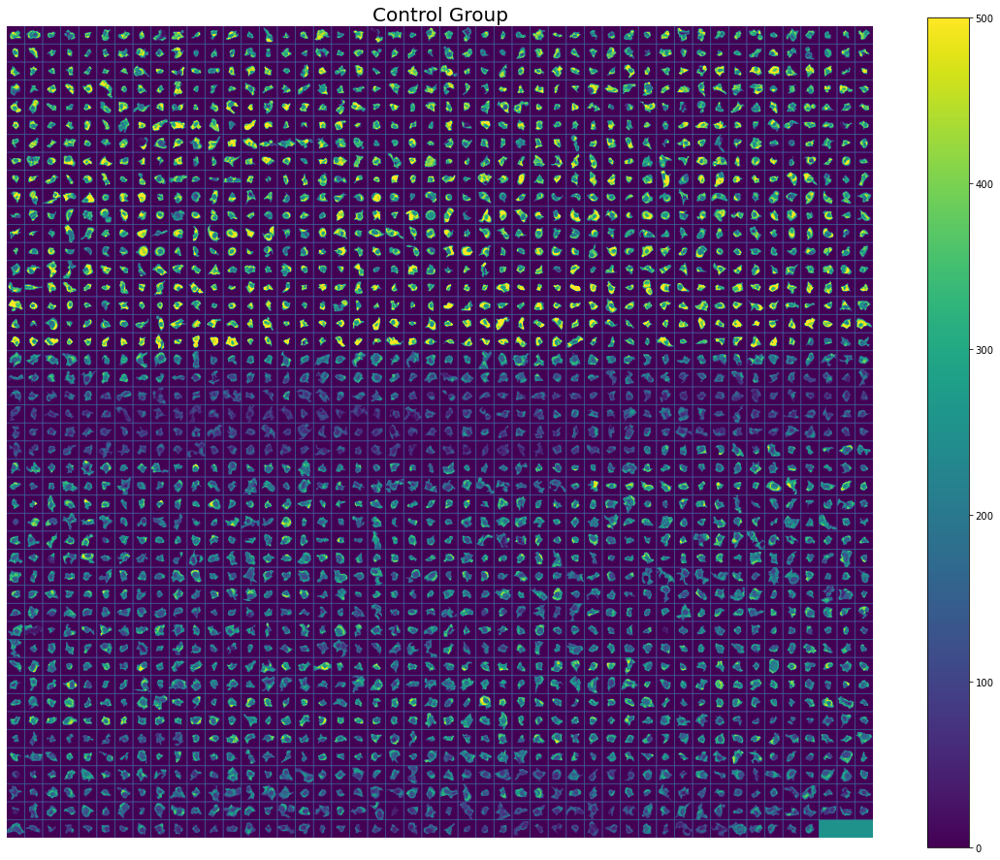

In [48]:
### Control Montage Image
a = [i[0] for i  in padControlList]
montageControlList = Montage_Image(a, 48, image_size=40, margin=1)
plt.figure(figsize=(20, round(montageControlList.shape[1] / montageControlList.shape[0] * 20)))
plt.imshow(montageControlList, cmap='viridis',vmax =500)
plt.axis('off')
plt.title('Control Group',fontsize = 20)
plt.colorbar(shrink=0.75)
plt.show()

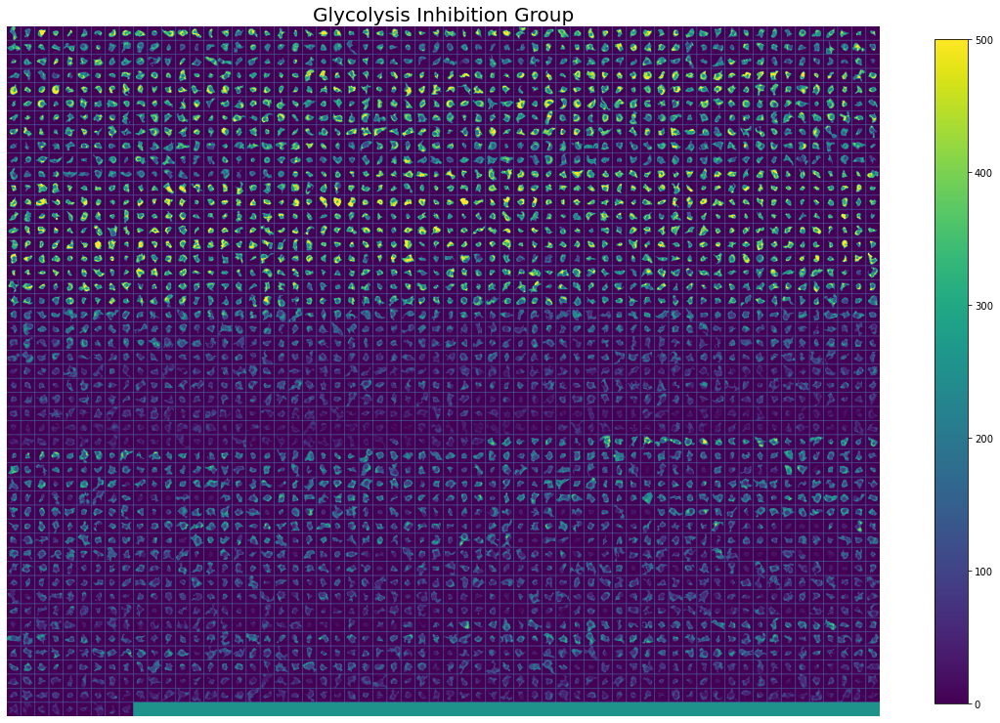

In [49]:
### Glycolysis Inhibition Montage Image
a = [i[0] for i  in padGlycolysisList]
montageGlycolysisList = Montage_Image(a, 62, image_size=40, margin=1)
plt.figure(figsize=(20, round(montageGlycolysisList.shape[1] / montageGlycolysisList.shape[0] * 20)))
plt.imshow(montageGlycolysisList, cmap='viridis',vmax =500)
plt.axis('off')
plt.title('Glycolysis Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.5)
plt.show()

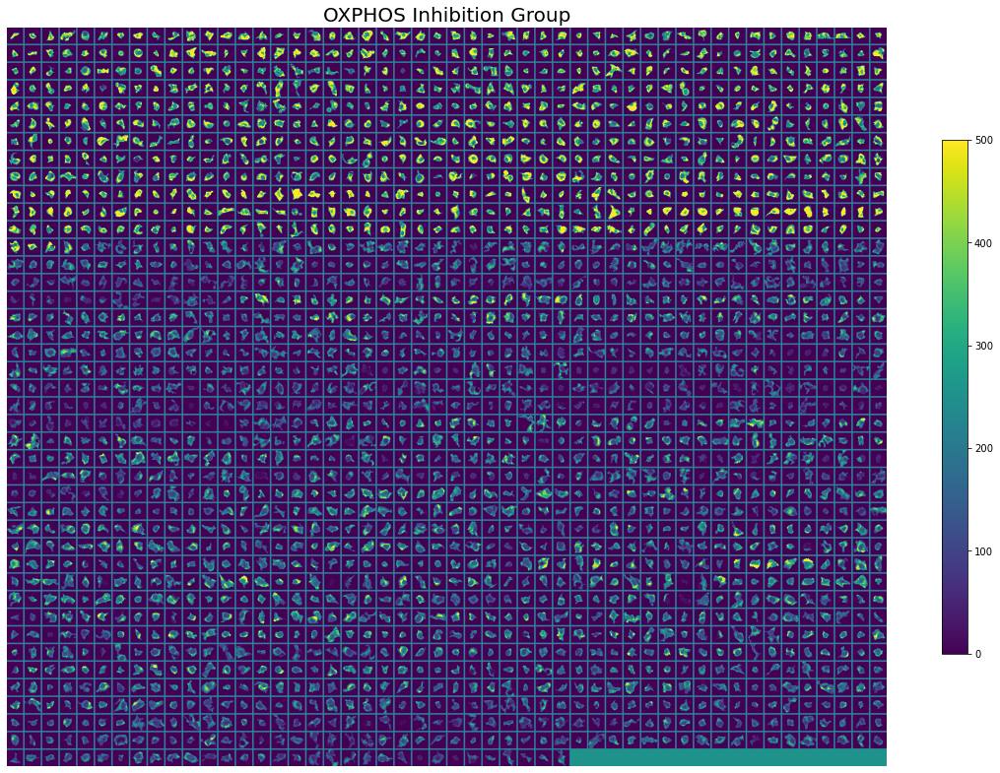

In [50]:
### OXPHOS Inhibition Montage Image
a = [i[0] for i  in padOXPHOSList]
montageOXPHOSList = Montage_Image(a, 50, image_size=40, margin=3)
plt.figure(figsize=(20, round(montageOXPHOSList.shape[1] / montageOXPHOSList.shape[0] * 20)))
plt.imshow(montageOXPHOSList, cmap='viridis',vmax =500)
plt.axis('off')
plt.title('OXPHOS Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.4)
plt.show()

#### tm Images

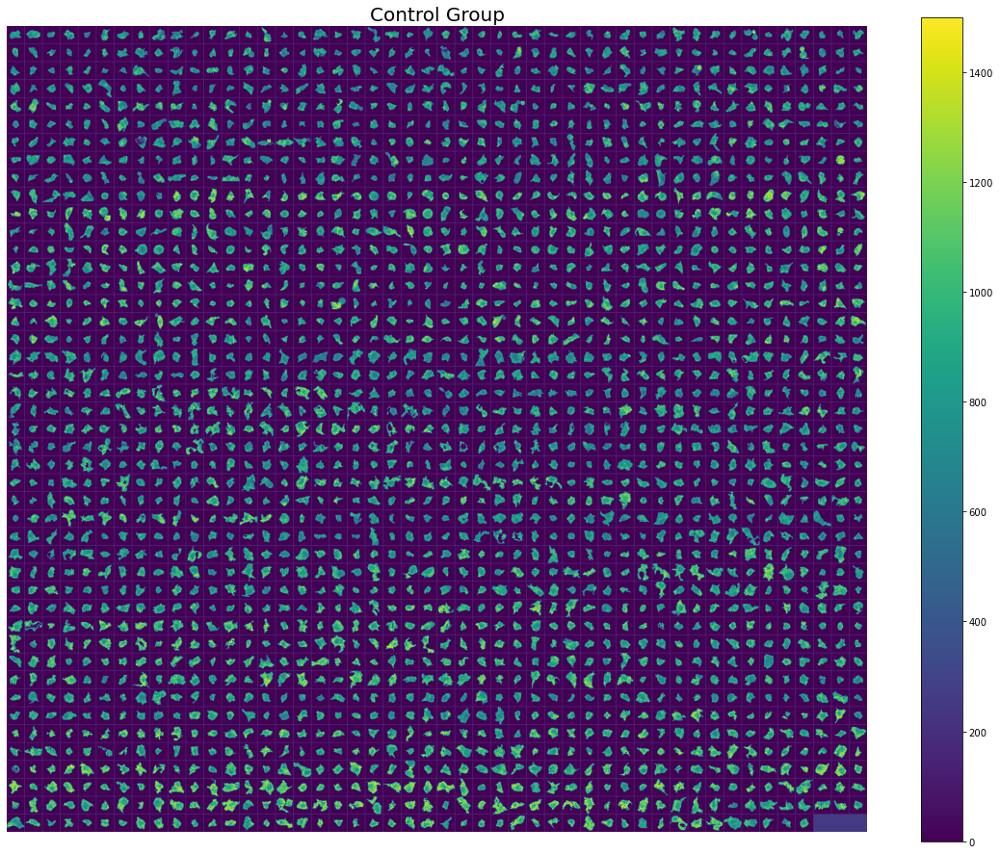

In [51]:
### Control Montage Image
a = [i[1] for i  in padControlList]
montageControlList = Montage_Image(a, 48, image_size=40, margin=1)
plt.figure(figsize=(20, round(montageControlList.shape[1] / montageControlList.shape[0] * 20)))
plt.imshow(montageControlList, cmap='viridis',vmax =1500)
plt.axis('off')
plt.title('Control Group',fontsize = 20)
plt.colorbar(shrink=0.75)
plt.show()

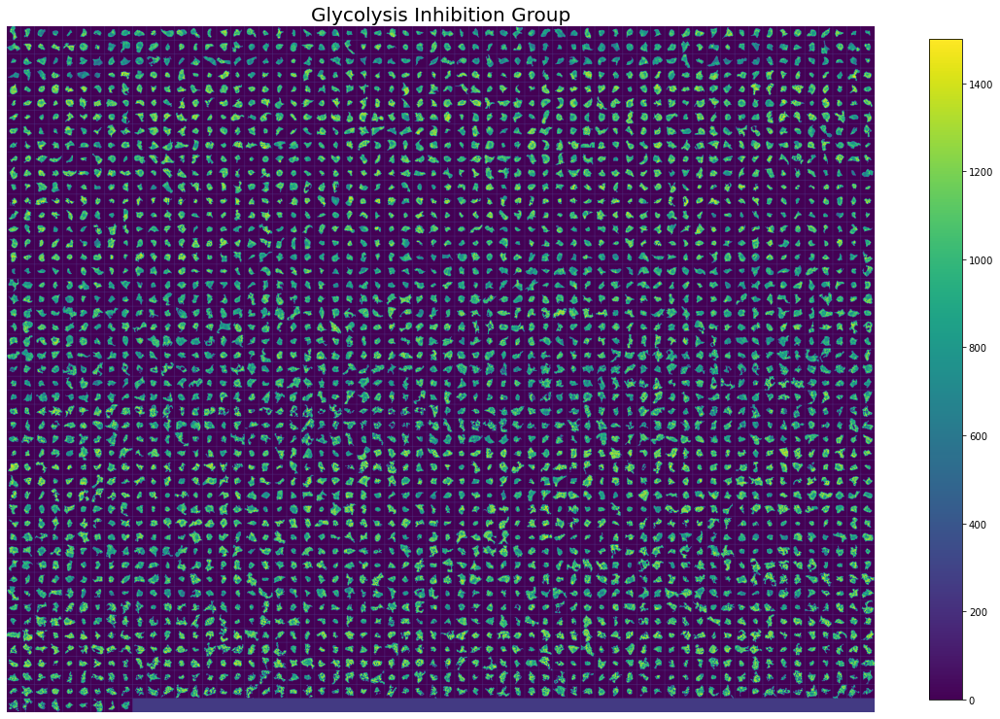

In [52]:
### Glycolysis Inhibition Montage Image
a = [i[1] for i  in padGlycolysisList]
montageGlycolysisList = Montage_Image(a, 62, image_size=40, margin=1)
plt.figure(figsize=(20, round(montageGlycolysisList.shape[1] / montageGlycolysisList.shape[0] * 20)))
plt.imshow(montageGlycolysisList, cmap='viridis',vmax =1500)
plt.axis('off')
plt.title('Glycolysis Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.5)
plt.show()

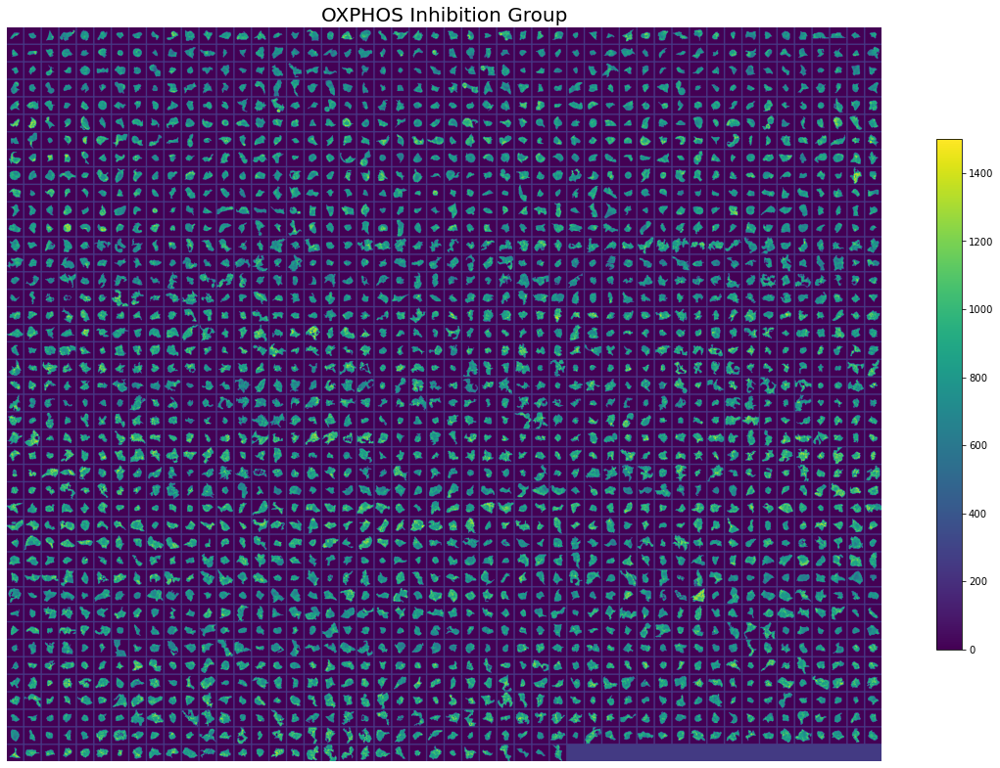

In [53]:
### OXPHOS Inhibition Montage Image
a = [i[1] for i  in padOXPHOSList]
montageOXPHOSList = Montage_Image(a, 50, image_size=40, margin=3)
plt.figure(figsize=(20, round(montageOXPHOSList.shape[1] / montageOXPHOSList.shape[0] * 20)))
plt.imshow(montageOXPHOSList, cmap='viridis',vmax =1500)
plt.axis('off')
plt.title('OXPHOS Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.4)
plt.show()

#### 5.2 23 X 23 Images

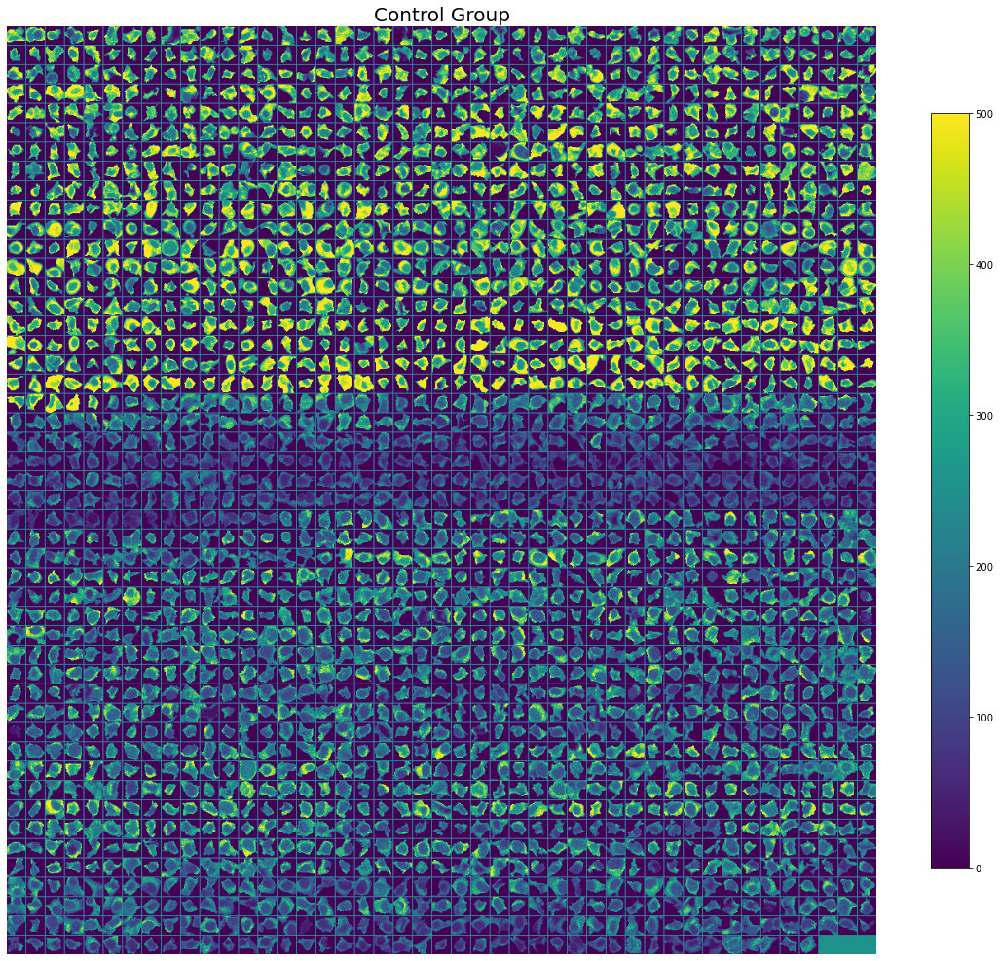

In [54]:
### Control Montage Image
a = [i[0] for i  in cropPadControlList]
montageControlList = Montage_Image(a, 45, image_size=23, margin=1)
plt.figure(figsize=(20, round(montageControlList.shape[1] / montageControlList.shape[0] * 20)))
plt.imshow(montageControlList, cmap='viridis', vmax = 500)
plt.axis('off')
plt.title('Control Group',fontsize = 20)
plt.colorbar(shrink=0.75)
plt.show()

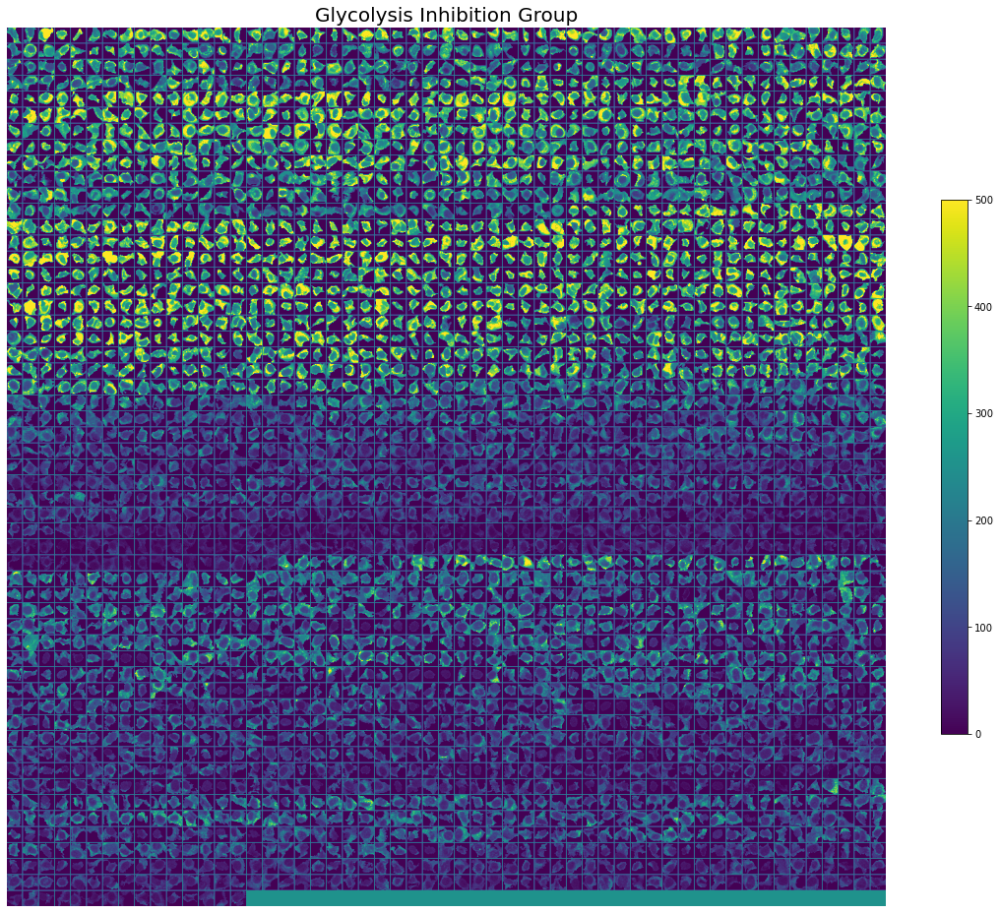

In [55]:
### Glycolysis Inhibition Montage Image
a = [i[0] for i  in cropPadGlycolysisList]
montageGlycolysisList = Montage_Image(a, 55, image_size=23, margin=1)
plt.figure(figsize=(20, round(montageGlycolysisList.shape[1] / montageGlycolysisList.shape[0] * 20)))
plt.imshow(montageGlycolysisList, cmap='viridis',vmax = 500)
plt.axis('off')
plt.title('Glycolysis Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.5)
plt.show()

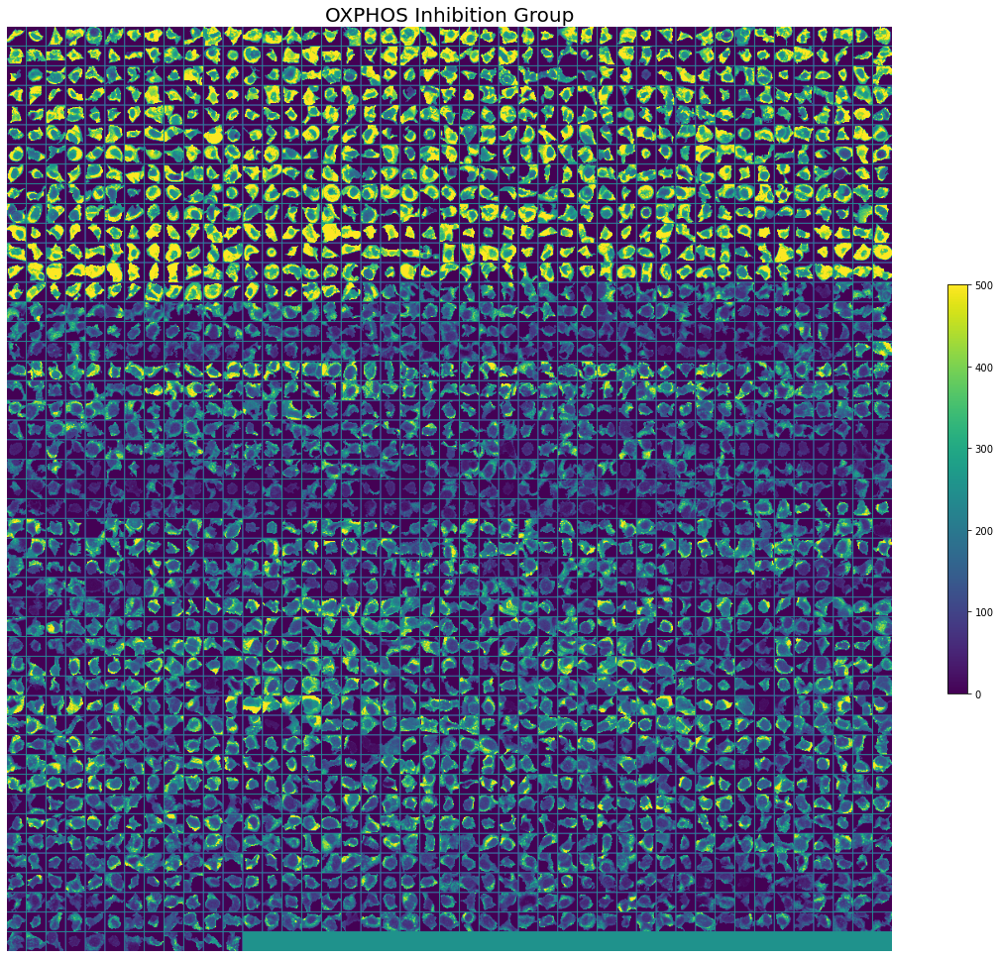

In [56]:
### OXPHOS Inhibition Montage Image
a = [i[0] for i  in cropPadOXPHOSList]
montageOXPHOSList = Montage_Image(a, 45, image_size=23, margin=1)
plt.figure(figsize=(20, round(montageOXPHOSList.shape[1] / montageOXPHOSList.shape[0] * 20)))
plt.imshow(montageOXPHOSList, cmap='viridis',vmax =500)
plt.axis('off')
plt.title('OXPHOS Inhibition Group',fontsize = 20)
plt.colorbar(shrink=0.4)
plt.show()

### 5. Summary

In [57]:
print(len(controlImageList))
print(len(glyImageList))
print(len(cyanideImageList))
print(len(padControlList))
print(len(padGlycolysisList))
print(len(padOXPHOSList))

2170
2996
2095
2157
2985
2082


<center> Data Summary </center>

| Step | Control | Glycolysis Inhibition | OXPHOS Inhibition|
| --- | --- | --- | ---|
| Raw Images | 2170 | 2996 | 2095|
| Filtering | 2157 |2985 | 2082 |